<a href="https://colab.research.google.com/github/SabrinOuni/COVID-19-Detection-Using-Deep-Learning-Algorithm-on-Chest-X-Ray-images/blob/main/Covid_19_Detection%20with%20X-ray%20images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://www.dropbox.com/sh/zzj5l1nvdoj7cu4/AABLDQXRuoUaezpTBCH56HuRa?dl=0

--2022-06-08 14:32:54--  https://www.dropbox.com/sh/zzj5l1nvdoj7cu4/AABLDQXRuoUaezpTBCH56HuRa?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /sh/raw/zzj5l1nvdoj7cu4/AABLDQXRuoUaezpTBCH56HuRa [following]
--2022-06-08 14:32:54--  https://www.dropbox.com/sh/raw/zzj5l1nvdoj7cu4/AABLDQXRuoUaezpTBCH56HuRa
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc28092a3b6ba2dfd76223cde6d6.dl.dropboxusercontent.com/zip_download_get/BKMn1ELWRZijSX8ziI2mmY8xKOE4annjweK-Kbl9PLtsQr9jBqN-h5BAnyFjj7Mqd99XjJglPoMJDXlJFcucne1pX87svxnfsDWxwygW7SU8nw# [following]
--2022-06-08 14:32:55--  https://uc28092a3b6ba2dfd76223cde6d6.dl.dropboxusercontent.com/zip_download_get/BKMn1ELWRZijSX8ziI2mmY8xKOE4annjweK-Kbl9PLtsQr9jBqN-h5BAnyFjj7Mqd99XjJglPoMJDXlJ

In [2]:
!unzip AABLDQXRuoUaezpTBCH56HuRa?dl=0


Archive:  AABLDQXRuoUaezpTBCH56HuRa?dl=0
mapname:  conversion of  failed
   creating: CovidDataset/
   creating: CovidDataset/Val/
   creating: CovidDataset/Train/
   creating: CovidDataset/Val/Covid/
   creating: CovidDataset/Val/Normal/
   creating: CovidDataset/Train/Covid/
   creating: CovidDataset/Train/Normal/
 extracting: CovidDataset/Train/Covid/AR-1.jpg  
 extracting: CovidDataset/Train/Covid/AR-2.jpg  
 extracting: CovidDataset/Train/Covid/paving.jpg  
 extracting: CovidDataset/Val/Covid/4-x-day1.jpg  
 extracting: CovidDataset/Val/Covid/16654_1_1.png  
 extracting: CovidDataset/Val/Covid/gr1_lrg-b.jpg  
 extracting: CovidDataset/Val/Covid/gr1_lrg-a.jpg  
 extracting: CovidDataset/Val/Covid/16654_4_1.jpg  
 extracting: CovidDataset/Val/Covid/16654_2_1.jpg  
 extracting: CovidDataset/Train/Covid/4-x-day1.jpg  
 extracting: CovidDataset/Train/Covid/16660_2_1.jpg  
 extracting: CovidDataset/Train/Covid/16660_3_1.jpg  
 extracting: CovidDataset/Train/Covid/gr1_lrg-b.jpg  
 extrac

In [3]:
TRAIN_PATH = "CovidDatatset/Train"
VAL_PATH = "CovidDataset/Test"

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt #used show the plots of each datapoint
#keras libaries are a tensorflow framework, used for implementing deep learning tools like Neural network layer/ different Deep learning models
from tensorflow.keras.layers import * #importing all the keras DL layers like like maxpooling layers / convolutional layers.... etc
from tensorflow.keras.models import * #importing all types of DL models
from tensorflow.keras.preprocessing import image 
#image prepocessing is used to change the quality of the images in order to ameliorate the output results
from sklearn.model_selection import train_test_split

# **Convolutional neural network CNN) MODEL**
input_shape=(224,224,3) each input image has the size of 224x224 each immage has 3 channels == RGB

In [5]:
#relu == fnct linear
#CNN model
model = Sequential()
#conv block starts here // block of layers is a group of different layers togetger
model.add(Conv2D(32,kernel_size=(3,3),activation='relu',input_shape=(224,224,3)))
model.add(Conv2D(64,(3,3),activation='relu')) 
model.add(MaxPooling2D(pool_size=(2,2)))  #MaxPooling2D layer is a type of layers that choose the max value in the cernel 
model.add(Dropout(0.25))
#ends here
#Convolution 
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2))) 
model.add(Dropout(0.25))
#Convolution
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
###""
model.add(Flatten())
model.add(Dense(64,activation='relu'))
model.add(Dropout(0.5))
# Fully Connected Layers
model.add(Dense(1,activation='sigmoid')) # ekher layer fil model/ nn, it has only one output because we have a binary classification ==== covid or healthy 
# Compiling the Neural network
model.compile(loss="binary_crossentropy",optimizer='adam',metrics=['accuracy']) #compile the model /// 


Model summary: 

In [6]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 64)      18496     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 64)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 110, 110, 64)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                    

# **Generate the dataset**

In [7]:
# Train from scratch
#DATA AUGMENTATION // apply some modifications to the model so it can better undrestand the different features and informations from the img for a better classification 
train_datagen = image.ImageDataGenerator(
    rescale = 1./255,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
)
test_dataset = image.ImageDataGenerator(rescale=1./255) #rescal only on the test we dont need zoom / h-flip

In [8]:
train_generator = train_datagen.flow_from_directory(
    '/content/CovidDataset/Train', target_size = (224,224), batch_size = 32, class_mode ='binary')

Found 448 images belonging to 2 classes.


In [9]:
train_generator.class_indices

{'Covid': 0, 'Normal': 1}

In [10]:
validation_generator = test_dataset.flow_from_directory(
    '/content/CovidDataset/Val', 
    target_size = (224,224),
    batch_size = 32,
    class_mode ='binary')

Found 160 images belonging to 2 classes.


In [11]:
num_train_samples = 224
num_test_samples = 60
batch_size = 32

In [12]:
log_dir = "/content/logs/"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


# **Training our model on the training model**

In [13]:
#(x_train, y_train), (x_test, y_test) = data.load_data()
history = model.fit(train_generator,
          epochs = 80,
          steps_per_epoch = int(num_train_samples/batch_size), 
          verbose = 10,
          validation_data = validation_generator,
          validation_steps = int(num_test_samples/batch_size),
          callbacks=[tensorboard_callback])

Epoch 1/80
Epoch 2/80
Epoch 3/80
Epoch 4/80
Epoch 5/80
Epoch 6/80
Epoch 7/80
Epoch 8/80
Epoch 9/80
Epoch 10/80
Epoch 11/80
Epoch 12/80
Epoch 13/80
Epoch 14/80
Epoch 15/80
Epoch 16/80
Epoch 17/80
Epoch 18/80
Epoch 19/80
Epoch 20/80
Epoch 21/80
Epoch 22/80
Epoch 23/80
Epoch 24/80
Epoch 25/80
Epoch 26/80
Epoch 27/80
Epoch 28/80
Epoch 29/80
Epoch 30/80
Epoch 31/80
Epoch 32/80
Epoch 33/80
Epoch 34/80
Epoch 35/80
Epoch 36/80
Epoch 37/80
Epoch 38/80
Epoch 39/80
Epoch 40/80
Epoch 41/80
Epoch 42/80
Epoch 43/80
Epoch 44/80
Epoch 45/80
Epoch 46/80
Epoch 47/80
Epoch 48/80
Epoch 49/80
Epoch 50/80
Epoch 51/80
Epoch 52/80
Epoch 53/80
Epoch 54/80
Epoch 55/80
Epoch 56/80
Epoch 57/80
Epoch 58/80
Epoch 59/80
Epoch 60/80
Epoch 61/80
Epoch 62/80
Epoch 63/80
Epoch 64/80
Epoch 65/80
Epoch 66/80
Epoch 67/80
Epoch 68/80
Epoch 69/80
Epoch 70/80
Epoch 71/80
Epoch 72/80
Epoch 73/80
Epoch 74/80
Epoch 75/80
Epoch 76/80
Epoch 77/80
Epoch 78/80
Epoch 79/80
Epoch 80/80


# **Evaluation of the model**

In [14]:
model.evaluate_generator(validation_generator)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


[0.7163850665092468, 0.6812499761581421]

Testing the model

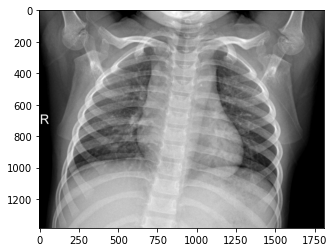

[1.]


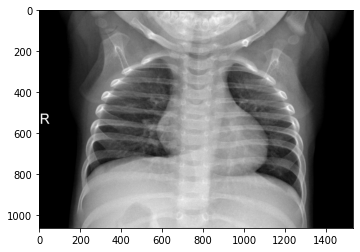

[1.]


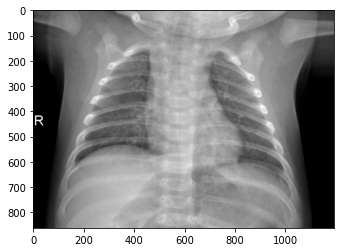

[1.]


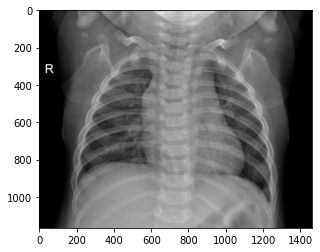

[1.]


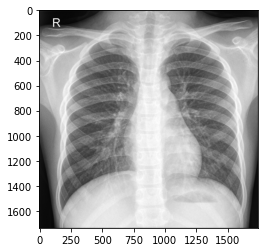

[0.]


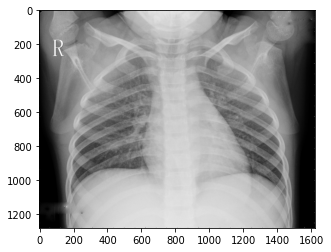

[3.30942e-31]


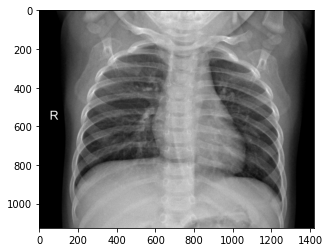

[1.]


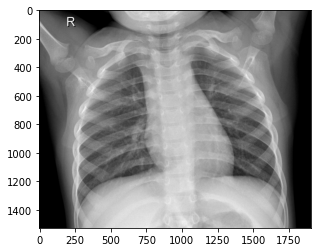

[0.]


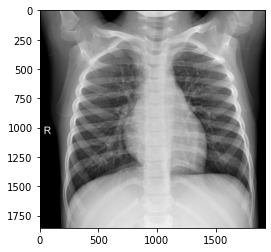

[1.]


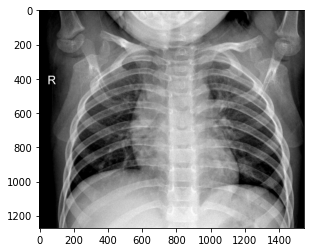

[1.]


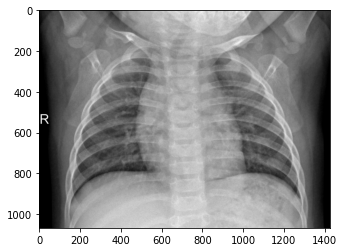

[1.]


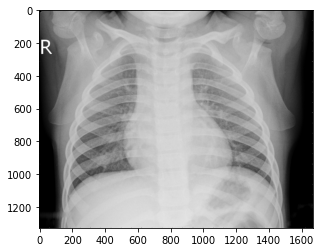

[0.]


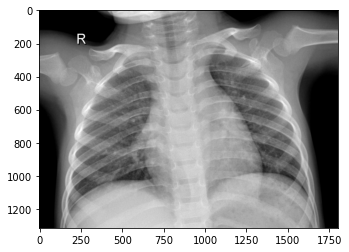

[0.]


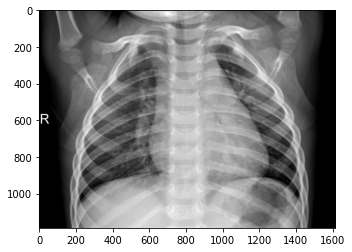

[1.]


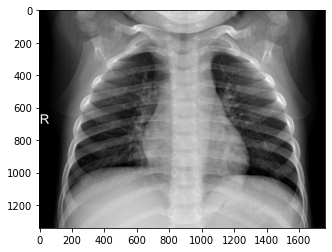

[1.]


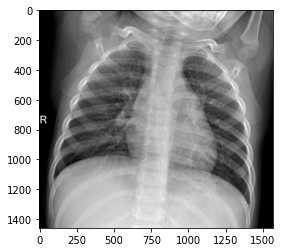

[1.]


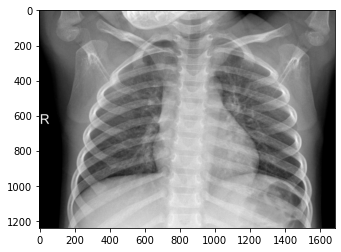

[1.]


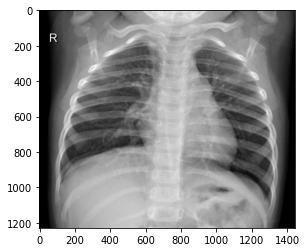

[0.]


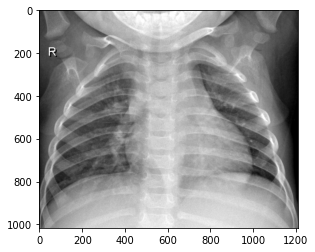

[0.]


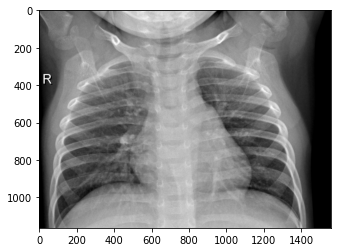

[0.991578]


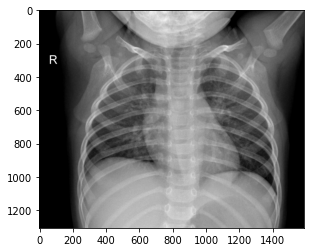

[0.]


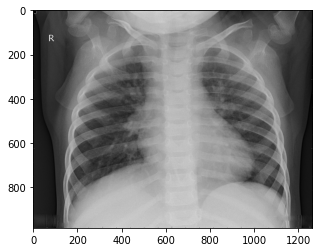

[0.]


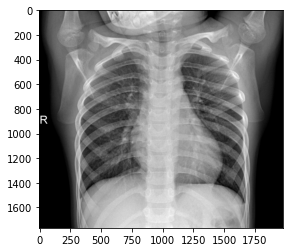

[1.]


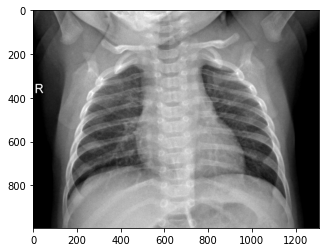

[1.]


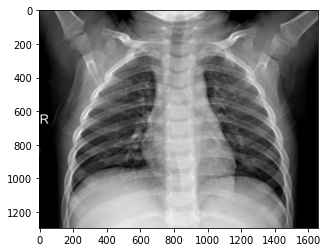

[1.]


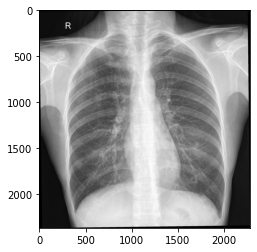

[0.]


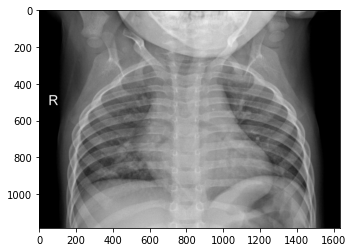

[1.]


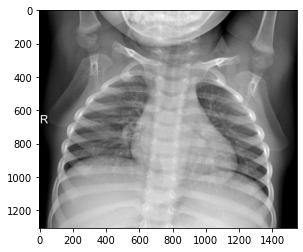

[1.]


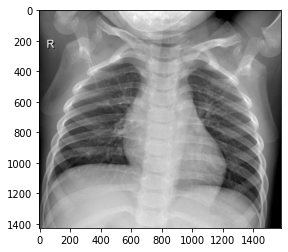

[0.]


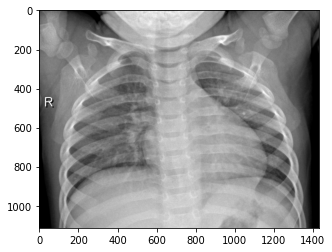

[1.]


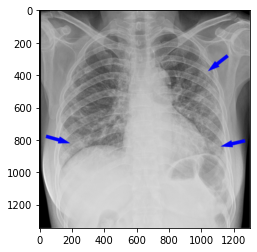

[0.]


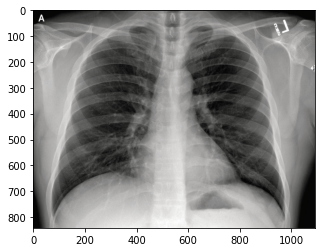

[0.]


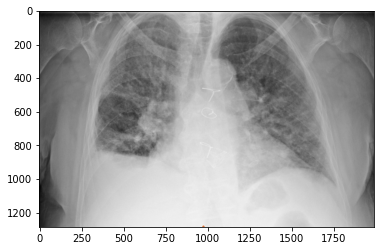

[0.46318313]


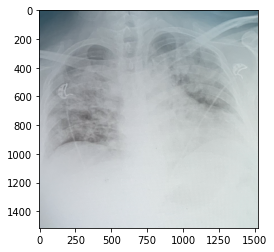

[0.46318313]


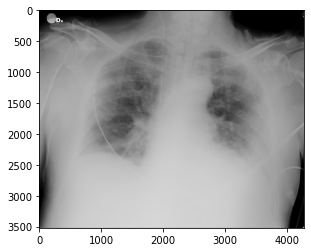

[0.]


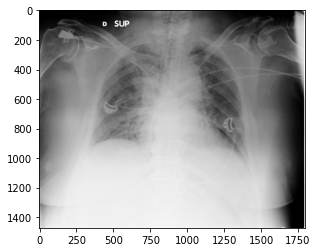

[1.]


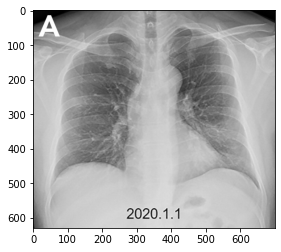

[0.]


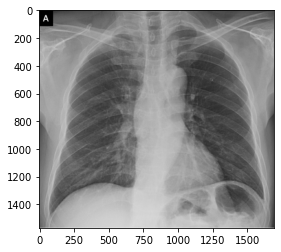

[0.]


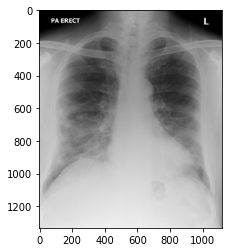

[0.]


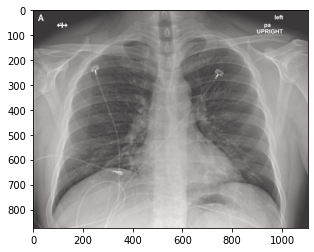

[0.]


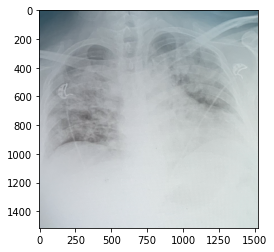

[0.46318313]


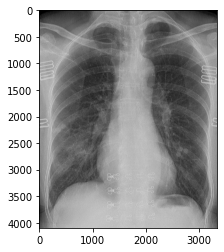

[0.46318313]


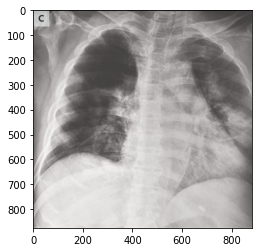

[3.0285885e-38]


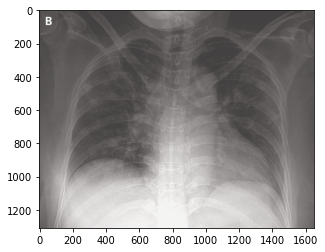

[0.]


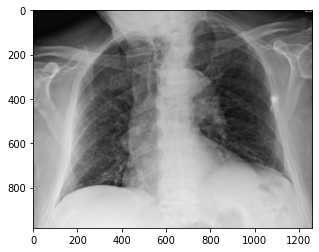

[2.988877e-31]


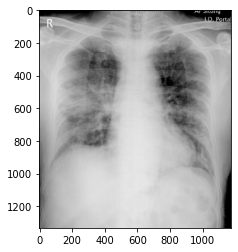

[0.]


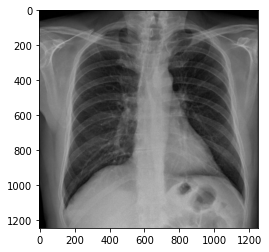

[0.00761452]


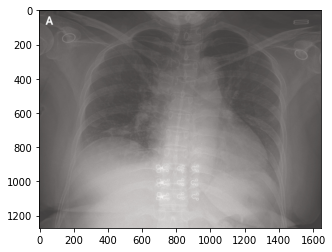

[0.]


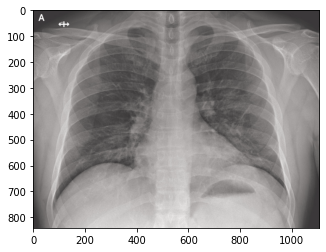

[0.]


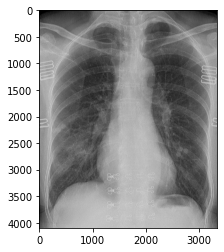

[0.46318313]


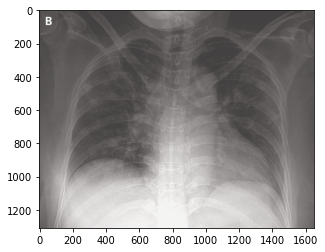

[0.]


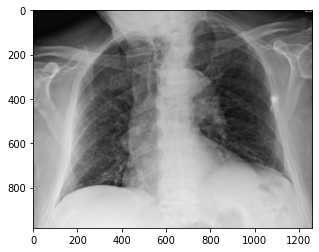

[2.988877e-31]


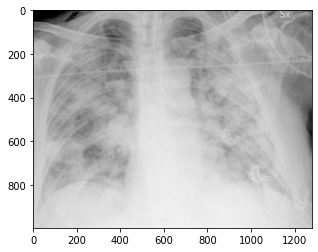

[6.1810453e-30]


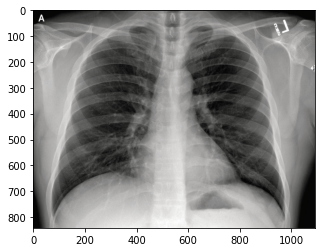

[0.]


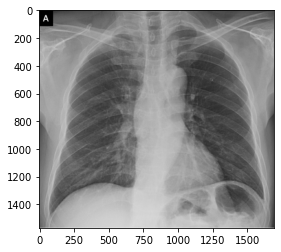

[0.]


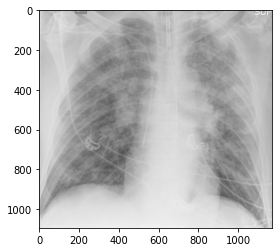

[0.46318313]


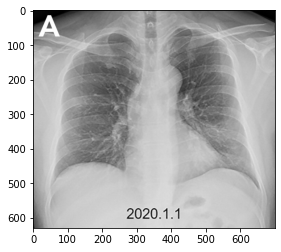

[0.]


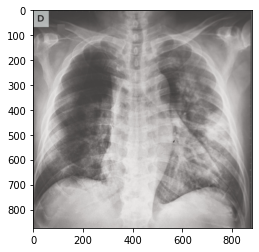

[0.]


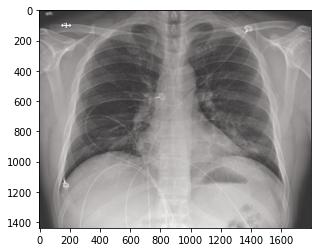

[0.]


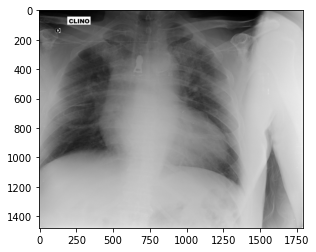

[0.]


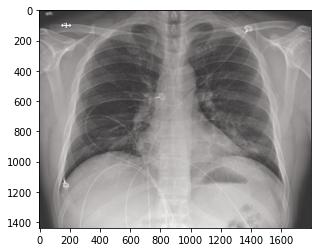

[0.]


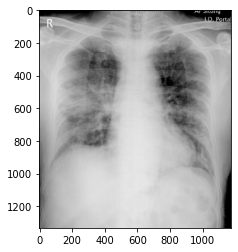

[0.]


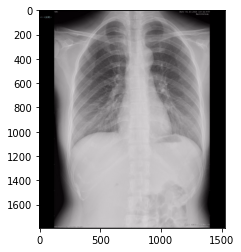

[0.]


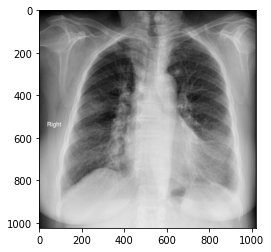

[0.969559]


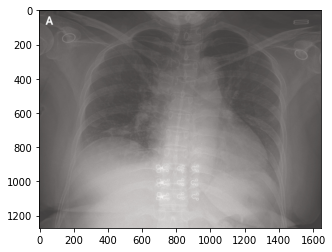

[0.]


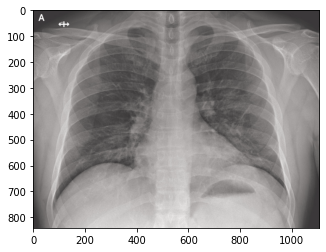

[0.]


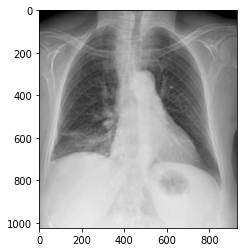

[0.04298411]


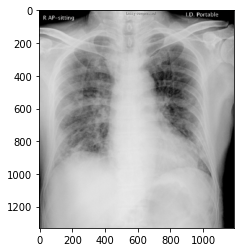

[0.]


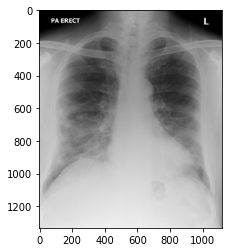

[0.]


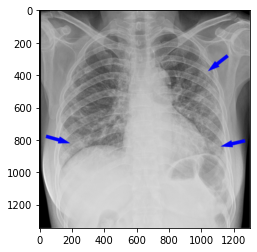

[0.]


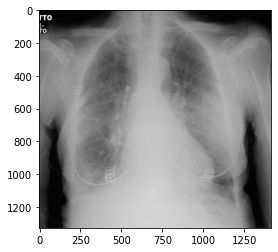

[0.]


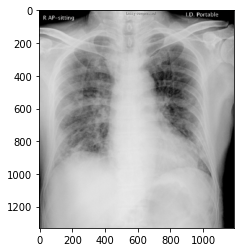

[0.]


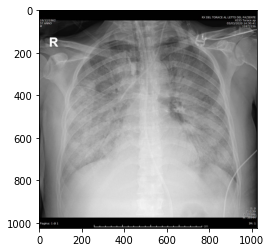

[0.]


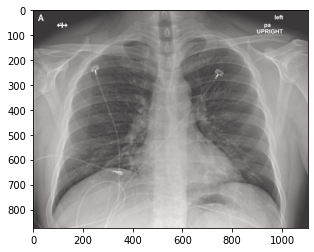

[0.]


In [15]:
import glob2 #read and acced to images ion a folder
import cv2 #bibl used for image processing // read; show .... 
test_set = glob2.glob("CovidDataset/Val/**/*.jpeg")

for i in test_set:
  img = cv2.imread(i)
  plt.imshow(img)
  plt.show()
  img = cv2.resize(img,(224,224))

  img = img.reshape(-1,224,224,3)
  prediction = model.predict(img)
  print(prediction[0])
   

In [16]:
%load_ext tensorboard

# **Accuracy and Loss plots on Tensor board**

In [17]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>